# Advanced Lane Finding
### Author: Paul Chun
### Date: 9-25-2017

### Camera Calibration

In [1]:
import numpy as np
import cv2
import glob
import pickle
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from ipywidgets import interact, interactive, fixed
from moviepy.editor import VideoFileClip
from IPython.display import HTML
from collections import deque
%matplotlib inline

Camera calibration image camera_cal/calibration1.jpg with index 0 failed.
Camera calibration image camera_cal/calibration4.jpg with index 1 failed.
Camera calibration image camera_cal/calibration5.jpg with index 2 failed.


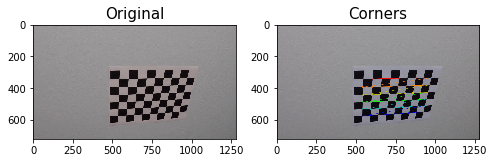

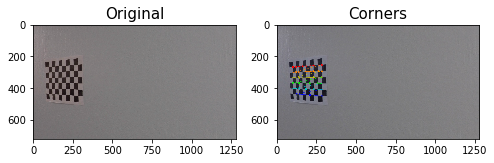

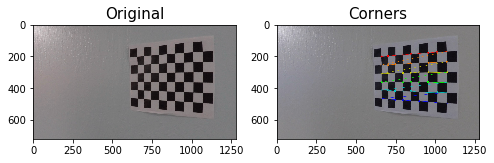

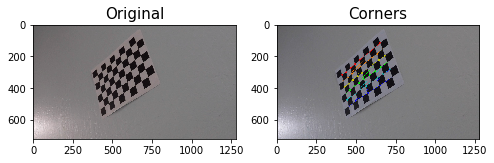

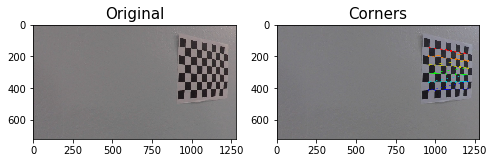

...

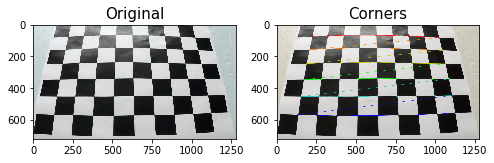

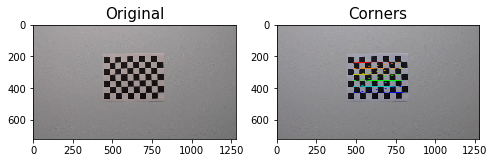

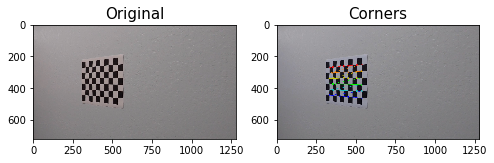

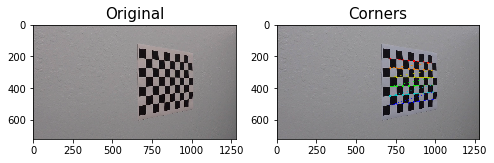

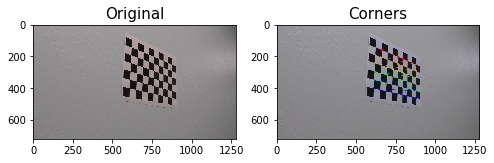

In [2]:
# prepare object points
nx = 6 # number of corners in a column 
ny = 9 # number of corners in a row
objp = np.zeros((nx*ny,3), np.float32)
objp[:,:2] = np.mgrid[0:9, 0:6].T.reshape(-1,2)

objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')
count = 0

for fname in images:
    
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    ret, corners = cv2.findChessboardCorners(gray,(9,6),None)
    
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        #Draw and display the corners
        cv2.drawChessboardCorners(img, (9,6), corners, ret)
        f, (ax1, ax2) = plt.subplots(1, 2, figsize = (8,4))
        ax1.imshow(cv2.cvtColor(mpimg.imread(fname), cv2.COLOR_BGR2RGB))
        ax1.set_title('Original', fontsize=15)
        ax2.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax2.set_title('Corners', fontsize=15)
    else:
        print('Camera calibration image', fname, 'with index', count, 'failed.')
        count += 1




### Distortion correction

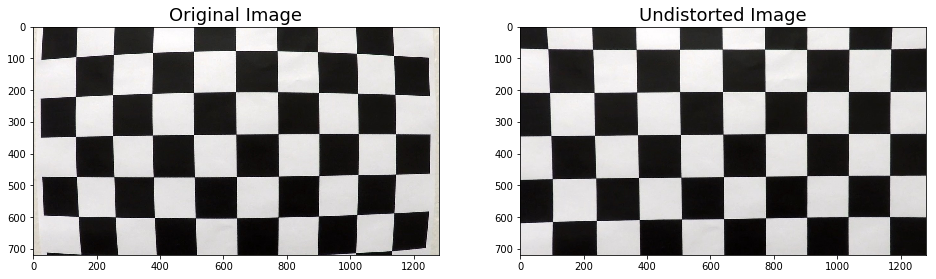

In [3]:
#for i in range(0, len(images)):
img = cv2.imread(images[0])
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1],None,None)
dst = cv2.undistort(img, mtx, dist, None)
#undist = undistort(gray, objpoints, imgpoints) 
dst = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)
f, (ax1, ax2) = plt.subplots(1, 2, figsize = (16,8))
ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
ax1.set_title('Original Image', fontsize=18)
ax2.imshow(dst)
#ax2.imshow(cv2.cvtColor(undist, cv2.COLOR_BGR2RGB))
ax2.set_title('Undistorted Image', fontsize=18)

In [4]:
def undistort(img):
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    undist = np.copy(dst)
    return undist

### Undistort test images

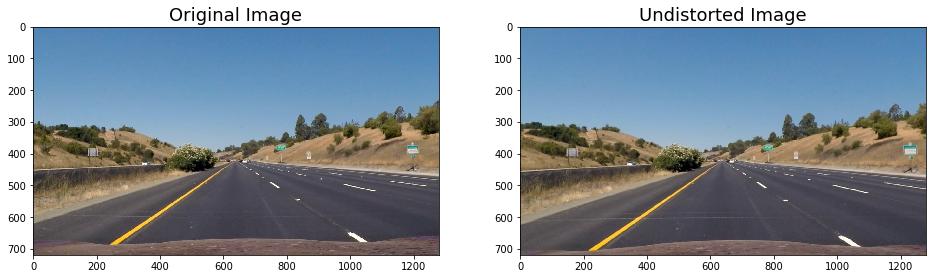

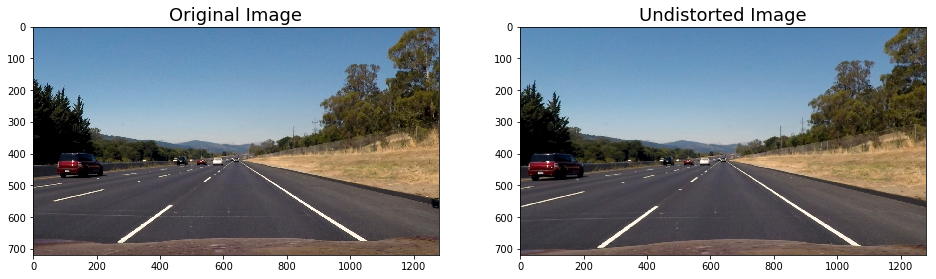

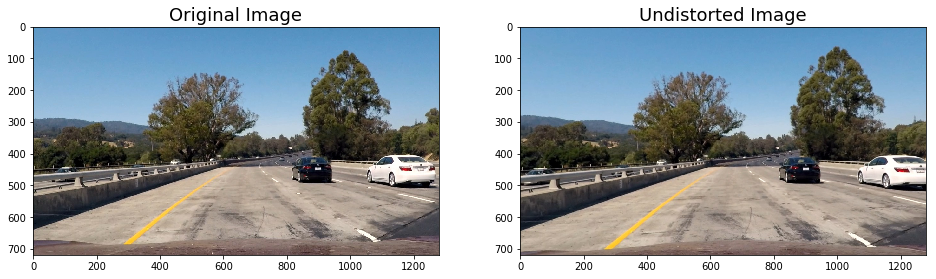

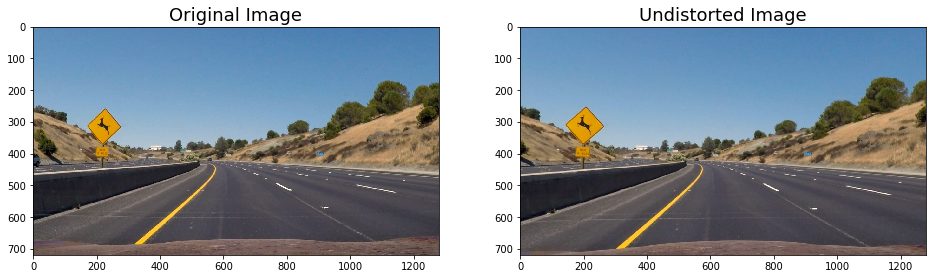

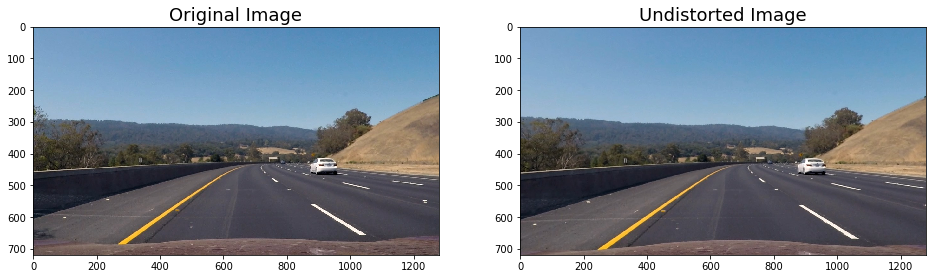

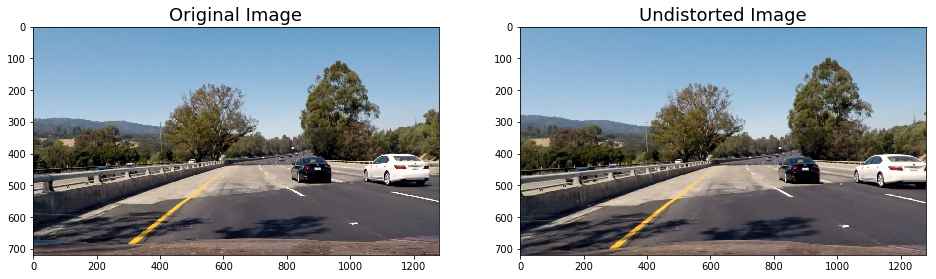

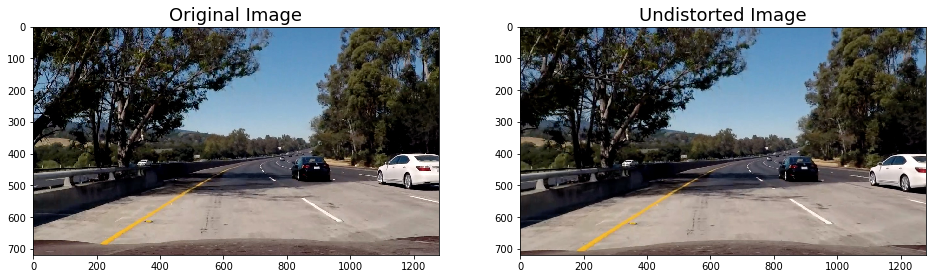

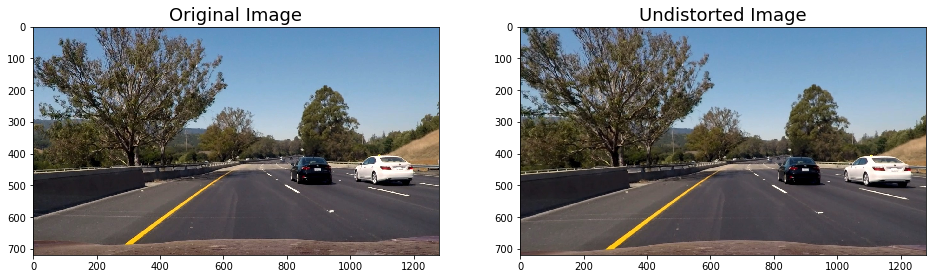

In [5]:
images = glob.glob('test_images/*.jpg')
for i in range(0, len(images)):
    img = cv2.imread(images[i])
    undist = undistort(img) 
    undist = cv2.cvtColor(undist, cv2.COLOR_BGR2RGB)
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize = (16,8))
    ax1.imshow(cv2.cvtColor(cv2.imread(images[i]), cv2.COLOR_BGR2RGB))
    ax1.set_title('Original Image', fontsize=18)
    ax2.imshow(undist)
    ax2.set_title('Undistorted Image', fontsize=18)

### Color/gradient threshold

In [6]:

def abs_sobel_thresh(img, orient='x',sobel_kernel = 3, thresh=(0,255)):
    
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
   
    if orient is 'x':
        sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
        abs_sobelx = np.absolute(sobelx)
        scaled_sobelx = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
        sxbinary = np.zeros_like(scaled_sobelx)
        sxbinary[(scaled_sobelx >= thresh[0]) & (scaled_sobelx <= thresh[1])] = 1
        binary_output = sxbinary
    else:
        sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
        abs_sobely = np.absolute(sobely)
        scaled_sobely = np.uint8(255*abs_sobely/np.max(abs_sobely))
        sybinary = np.zeros_like(scaled_sobely)
        sybinary[(scaled_sobely >= thresh[0]) & (scaled_sobely <= thresh[1])] = 1
        binary_output = sybinary

    return binary_output

def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel )
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel )
    mag = np.sqrt(sobelx**2 + sobely**2)
    scale_factor = np.max(mag)/255
    scaled_sobel = (mag/scale_factor).astype(np.uint8)
    sbinary = np.zeros_like(scaled_sobel)
    sbinary[(scaled_sobel >= mag_thresh[0]) & (scaled_sobel <= mag_thresh[1])] = 1
    binary_output = sbinary
    return binary_output

def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):

    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
   
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    
    dir = np.arctan2(abs_sobely, abs_sobelx)

    sxbinary = np.zeros_like(dir)
    sxbinary[(dir >= thresh[0]) & (dir <=thresh[1])] = 1
   
    binary_output = sxbinary
    return binary_output

def combined_thresh(img):
    
    gradx = abs_sobel_thresh(img, orient='x', sobel_kernel = ksize, thresh = (10,255))
    grady = abs_sobel_thresh(img, orient='y', sobel_kernel = ksize, thresh = (60,255))
    
    mag_binary = mag_thresh(img, sobel_kernel = ksize, mag_thresh=(40,255))
    
    dir_binary = dir_threshold(img, sobel_kernel = ksize, thresh = (0.65, 1.05))

    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1)& (grady == 1) | ((mag_binary == 1) & (dir_binary == 1)))] = 1
    
    return combined
    

In [7]:
def region_of_interest(img, vertices):
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

### Finding the best color space for lane lines in RGB and HSL

In [9]:
def RGB(img):
    R = img[:,:,0]
    G = img[:,:,1]
    B = img[:,:,2]
    
    return R, G, B

def RGB_thresh(img, channel, thresh=(0, 255)):
    R, G, B = RGB(img)
    
    if (channel == 'R'):
        binary_R = np.zeros_like(R)
        binary_R[(R > thresh[0]) & (R <= thresh[1])] = 1
        binary = binary_R
    elif (channel == 'G'):
        binary_G = np.zeros_like(G)
        binary_G[(G > thresh[0]) & (G <= thresh[1])] = 1
        binary = binary_G
    elif (channel == 'B'):
        binary_B = np.zeros_like(B)
        binary_B[(B > thresh[0]) & (B <= thresh[1])] = 1
        binary = binary_B
    else:
        binary = None

    return binary

def HLS(img):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    
    H = hls[:,:,0]
    L = hls[:,:,1]
    S = hls[:,:,2]
    
    return H, L, S

def HLS_thresh(img, channel, thresh=(0, 255)):
    H, L, S = HLS(img)
    
    if ( channel == 'H'):
        binary_H = np.zeros_like(H)
        binary_H[(H > thresh[0]) & (H <= thresh[1])] = 1
        binary = binary_H
    elif ( channel == 'L'):
        binary_L = np.zeros_like(L)
        binary_L[(L > thresh[0]) & (L <= thresh[1])] = 1
        binary = binary_L
    elif ( channel == 'S'):
        binary_S = np.zeros_like(S)
        binary_S[(S > thresh[0]) & (S <= thresh[1])] = 1
        binary = binary_S
    else:
        binary = None
        
    return binary

def HSV(img):
    HSV = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    
    H = HSV[:,:,0]
    S = HSV[:,:,1]
    V = HSV[:,:,2]
    
    return H, S, V

def HSV_thresh(img, channel, thresh=(0, 255)):
    H, S, V = HSV(img)
    
    if (channel == 'H'):
        binary_H = np.zeros_like(H)
        binary_H[(H > thresh[0]) & (H <= thresh[1])] = 1
        binary = binary_H
    elif (channel == 'S'):
        binary_S = np.zeros_like(S)
        binary_S[(S > thresh[0]) & (S <= thresh[1])] = 1
        binary = binary_S
    elif (channel == 'V'):
        binary_V = np.zeros_like(V)
        binary_V[(V > thresh[0]) & (V <= thresh[1])] = 1
        binary = binary_V
    else:
        binary = None
    
    return binary

def LAB(img):
    LAB = cv2.cvtColor(img, cv2.COLOR_RGB2Lab)
    
    L = LAB[:,:,0]
    A = LAB[:,:,1]
    B = LAB[:,:,2]
    
    return L, A, B

def LAB_thresh(img, channel, thresh=(0, 255)):
    L, A, B = LAB(img)
    
    if (channel == 'L'):
        binary_L = np.zeros_like(L)
        binary_L[(L > thresh[0]) & (L <= thresh[1])] = 1
        binary = binary_L
    elif (channel == 'A'):
        binary_A = np.zeros_like(A)
        binary_A[(A > thresh[0]) & (A <= thresh[1])] = 1
        binary = binary_A
    elif (channel == 'B'):
        binary_B = np.zeros_like(B)
        binary_B[(B > thresh[0]) & (B <= thresh[1])] = 1
        binary = binary_B
    else:
        binary = None
    
    return binary

def LUV(img):
    LUV = cv2.cvtColor(img, cv2.COLOR_RGB2Luv)
    
    L = LUV[:, :, 0]
    U = LUV[:, :, 1]
    V = LUV[:, :, 2]
    
    return L, U, V
    
def LUV_thresh(img, channel, thresh=(0, 255)):
    L, U, V = LUV(img)
   
    if (channel == 'L'):
        binary_L = np.zeros_like(L)
        binary_L[(L > thresh[0]) & (L <= thresh[1])] = 1
        binary = binary_L
    elif (channel == 'U'):
        binary_U = np.zeros_like(U)
        binary_U[(U > thresh[0]) & (U <= thresh[1])] = 1
        binary = binary_U
    elif (channel == 'V'):
        binary_V = np.zeros_like(V)
        binary_V[(V > thresh[0]) & (V <= thresh[1])] = 1
        binary = binary_V
    else:
        binary = binary_V
        
    return binary
    
    

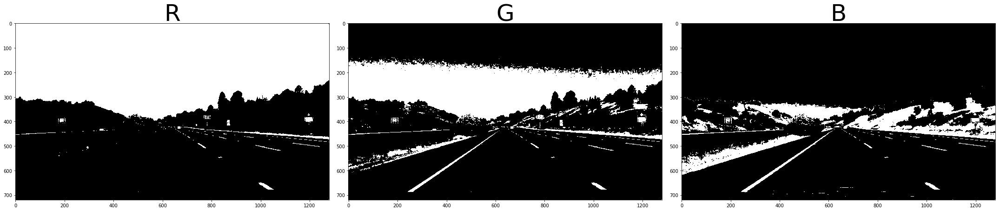

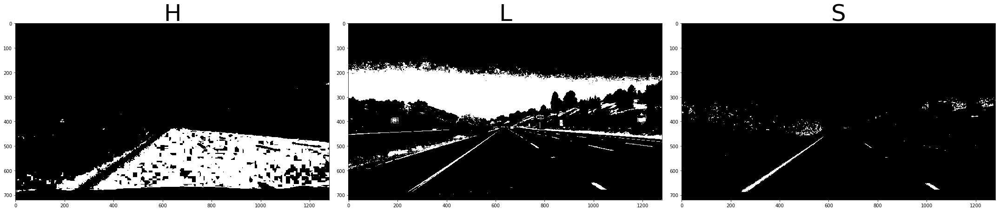

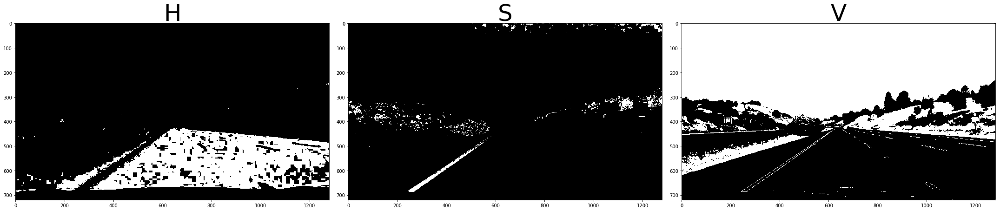

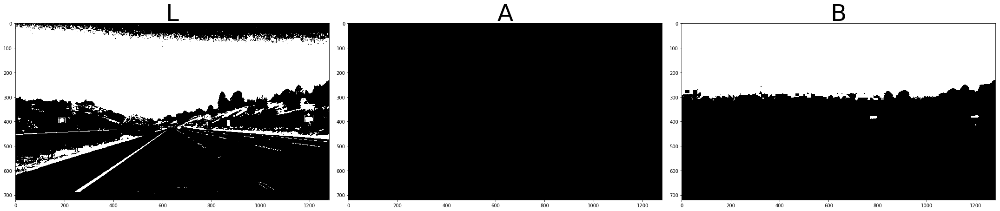

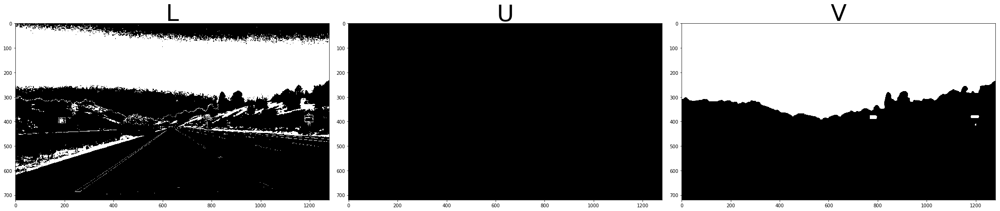

...

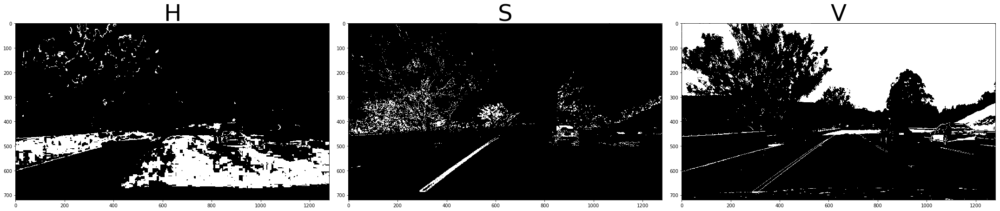

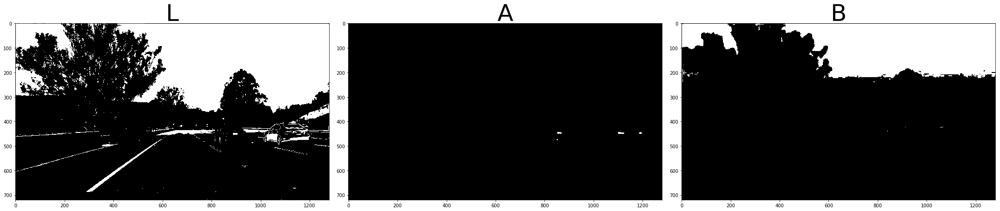

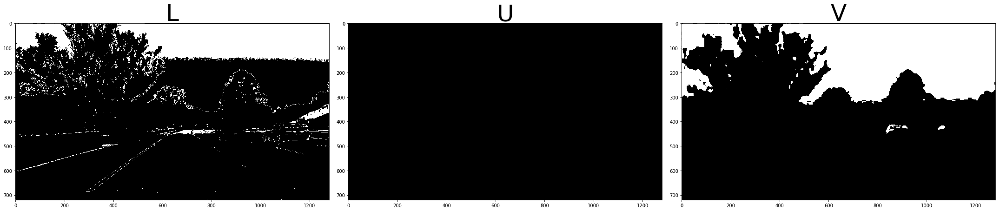

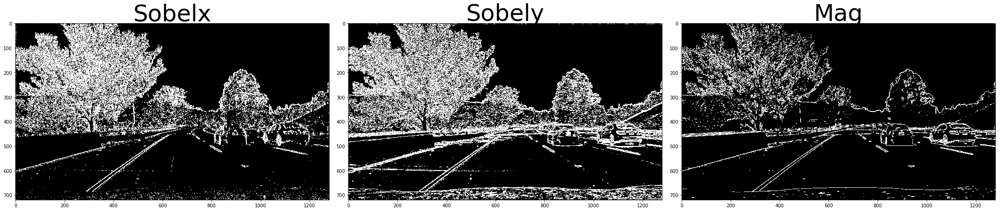

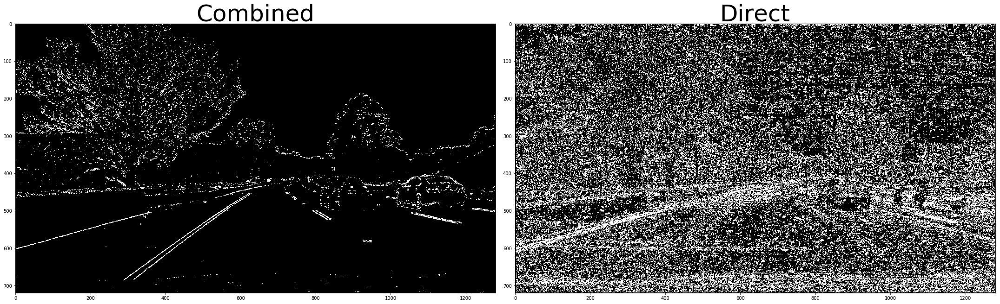

In [10]:
for i in range(0, len(images)):
    img = cv2.imread(images[i])
    
    R = RGB_thresh(img, 'R', thresh=(150, 255))
    G = RGB_thresh(img, 'G', thresh=(150, 255))
    B = RGB_thresh(img, 'B', thresh=(150, 255))
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize = (30, 15))
    f.tight_layout()
    ax1.imshow(R, cmap = 'gray')
    ax1.set_title('R', fontsize=50)
    ax2.imshow(G, cmap = 'gray')
    ax2.set_title('G', fontsize=50)
    ax3.imshow(B, cmap = 'gray')
    ax3.set_title('B', fontsize=50)
    
    H = HLS_thresh(img, 'H', thresh=(150, 255))
    L = HLS_thresh(img, 'L', thresh=(150, 255))
    S = HLS_thresh(img, 'S', thresh=(150, 255))
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize = (30, 15))
    f.tight_layout()
    ax1.imshow(H, cmap = 'gray')
    ax1.set_title('H', fontsize=50)
    ax2.imshow(L, cmap = 'gray')
    ax2.set_title('L', fontsize=50)
    ax3.imshow(S, cmap = 'gray')
    ax3.set_title('S', fontsize=50)
    
    
    H = HSV_thresh(img, 'H', thresh=(150, 230))
    S = HSV_thresh(img, 'S', thresh=(150, 230))
    V = HSV_thresh(img, 'V', thresh=(150, 230))
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize = (30, 15))
    f.tight_layout()
    ax1.imshow(H, cmap = 'gray')
    ax1.set_title('H', fontsize=50)
    ax2.imshow(S, cmap = 'gray')
    ax2.set_title('S', fontsize=50)
    ax3.imshow(V, cmap = 'gray')
    ax3.set_title('V', fontsize=50)
    
    L = LAB_thresh(img, 'L', thresh=(150, 230))
    A = LAB_thresh(img, 'A', thresh=(150, 230))
    B = LAB_thresh(img, 'B', thresh=(150, 230))
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize = (30, 15))
    f.tight_layout()
    ax1.imshow(L, cmap = 'gray')
    ax1.set_title('L', fontsize=50)
    ax2.imshow(A, cmap = 'gray')
    ax2.set_title('A', fontsize=50)
    ax3.imshow(B, cmap = 'gray')
    ax3.set_title('B', fontsize=50)
    
    L = LUV_thresh(img, 'L', thresh=(150, 180))
    U = LUV_thresh(img, 'U', thresh=(150, 230))
    V = LUV_thresh(img, 'V', thresh=(150, 230))
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize = (30, 15))
    f.tight_layout()
    ax1.imshow(L, cmap = 'gray')
    ax1.set_title('L', fontsize=50)
    ax2.imshow(U, cmap = 'gray')
    ax2.set_title('U', fontsize=50)
    ax3.imshow(V, cmap = 'gray')
    ax3.set_title('V', fontsize=50)
    
    sobelx = abs_sobel_thresh(img, orient='x',sobel_kernel = 3, thresh=(10,255))
    sobely = abs_sobel_thresh(img, orient='y',sobel_kernel = 3, thresh=(10,255))
    direct = dir_threshold(img, sobel_kernel=3, thresh=(1.0, 1.5))
    mag = mag_thresh(img, sobel_kernel=3, mag_thresh=(40,255))
    
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize = (30, 15))
    f.tight_layout()
    ax1.imshow(sobelx, cmap = 'gray')
    ax1.set_title('Sobelx', fontsize=50)
    ax2.imshow(sobely, cmap = 'gray')
    ax2.set_title('Sobely', fontsize=50)
    ax3.imshow(mag, cmap = 'gray')
    ax3.set_title('Mag', fontsize=50)
    
    combined=combined_thresh(img)
    f, (ax1,ax2) = plt.subplots(1, 2, figsize = (30, 15))
    f.tight_layout()
    ax1.imshow(combined, cmap = 'gray')
    ax1.set_title('Combined', fontsize=50)
    ax2.imshow(direct, cmap = 'gray')
    ax2.set_title('Direct', fontsize=50)


S channel finds the yellow line more consistent than any other channels in HLS color space and any color channels in RGB color space.

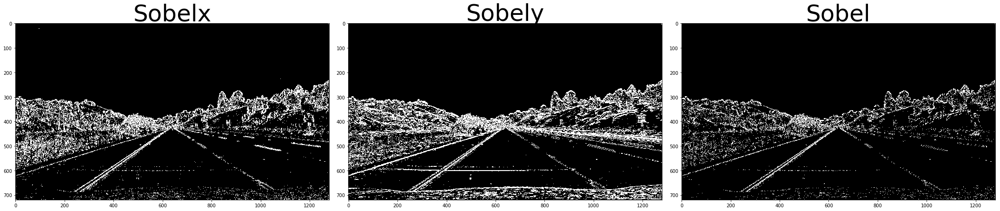

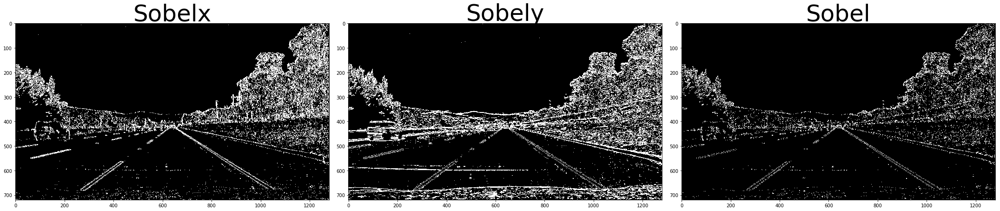

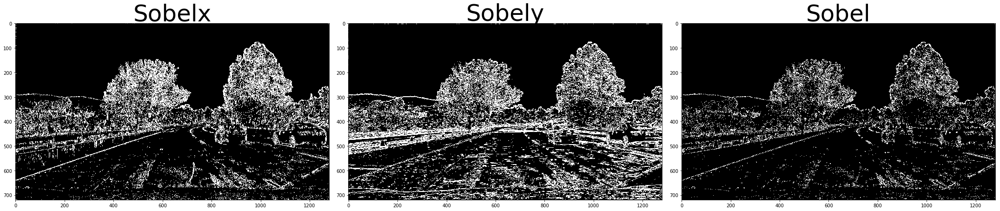

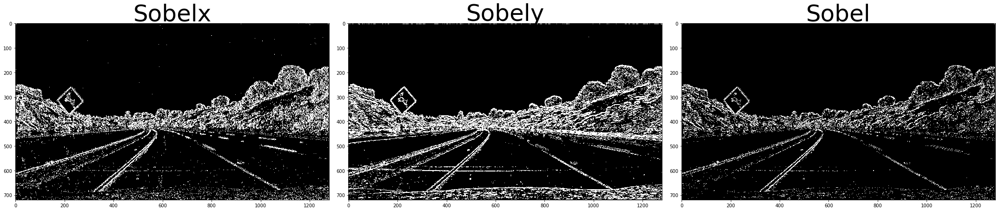

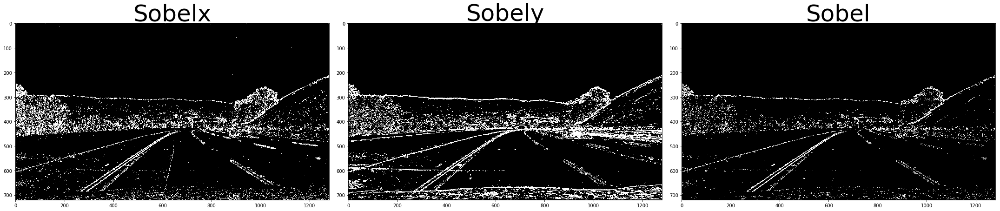

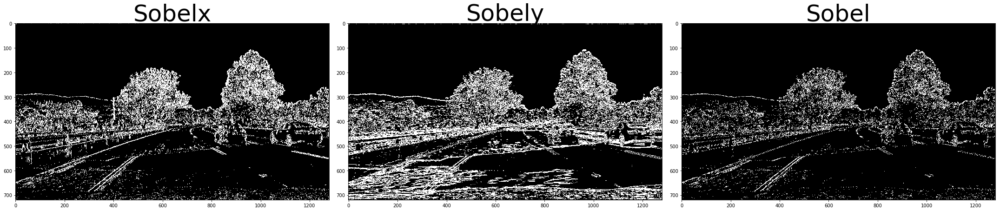

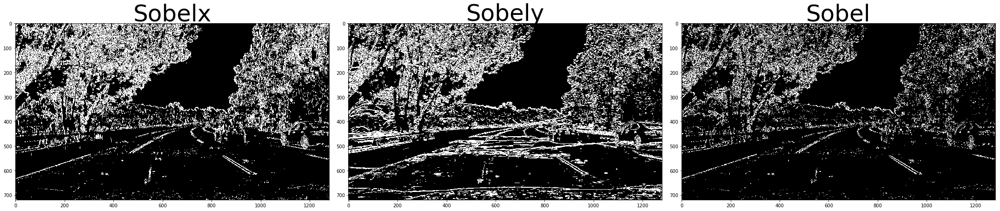

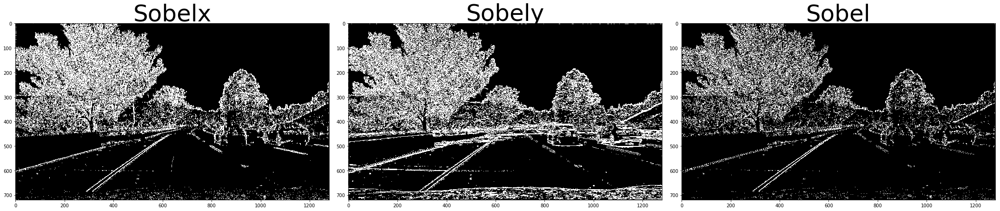

In [11]:
for i in range(0, len(images)):
    img = cv2.imread(images[i])
    sobelx = abs_sobel_thresh(img, orient='x',sobel_kernel = 3, thresh=(10,100))
    sobely = abs_sobel_thresh(img, orient='y',sobel_kernel = 3, thresh=(10,100))
    sobel=np.zeros_like(sobelx)
    sobel [(sobelx==1)&(sobely==1)]=1
    direct = dir_threshold(img, sobel_kernel=3, thresh=(1.0, 1.5))
    mag = mag_thresh(img, sobel_kernel=3, mag_thresh=(40,255))
    
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize = (30, 15))
    f.tight_layout()
    ax1.imshow(sobelx, cmap = 'gray')
    ax1.set_title('Sobelx', fontsize=50)
    ax2.imshow(sobely, cmap = 'gray')
    ax2.set_title('Sobely', fontsize=50)
    ax3.imshow(sobel, cmap = 'gray')
    ax3.set_title('Sobel', fontsize=50)

### Perspective Transform

In [12]:
def unwarp(img, src, dst, Display=False):
    #
    M = cv2.getPerspectiveTransform(src, dst)
    #
    Minv = cv2.getPerspectiveTransform(dst, src)
    #
    img_size = (img.shape[1], img.shape[0])
    unwarped_img = cv2.warpPerspective(img, M, img_size)
    
    if Display is True:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize= (20, 10))
        ax1.imshow(img,cmap='gray')
        x1 = [src[0][0], src[2][0], src[3][0], src[1][0], src[0][0]]
        y1 = [src[0][1], src[2][1], src[3][1], src[1][1], src[0][1]]
        ax1.plot(x1,y1, color='#00FFFF', alpha=0.6, linewidth=4)
        ax1.set_title('Combined Binary Image',fontsize=18)
        ax2.imshow(unwarped_img, cmap='gray')
        x2 = [dst[0][0], dst[2][0], dst[3][0], dst[1][0], dst[0][0]]
        y2 = [dst[0][1], dst[2][1], dst[3][1], dst[1][1], dst[0][1]]
        ax2.plot(x2,y2, color='#00FFFF', alpha=0.8, linewidth=4)
        ax2.set_title('Unwarped Image',fontsize=18)
    
    return unwarped_img, M, Minv

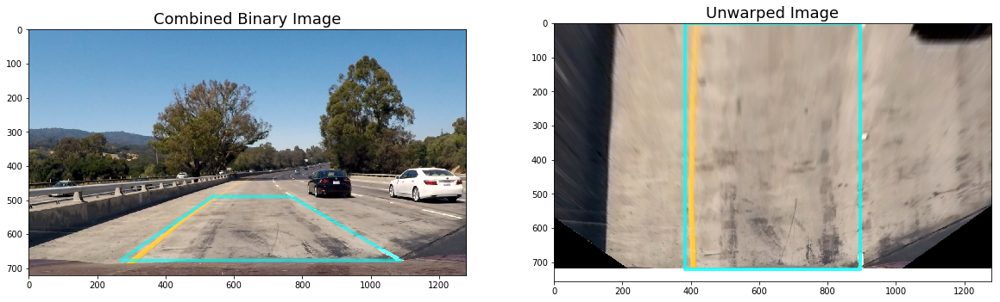

In [13]:
img = cv2.imread(images[2])
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
undist = undistort(img)

height, width = img.shape[:2]

src = np.float32([(0.42*width,0.68*height), 
                  (0.60*width, 0.68*height), 
                  (0.21*width, 0.94*height), 
                  (0.85*width, 0.94*height)])
dst = np.float32([(0.30*width,0),(0.70*width,0),(0.30*width,height),(0.70*width,height)])
    
S = HLS_thresh(img, 'S', thresh=(150, 255))

unwarped_img, M, Minv = unwarp(img, src, dst, Display=True)

In [39]:
def image_process_pipeline(img, Display=False):
    undist_img = undistort(img)

    width = undist_img.shape[1]
    height = undist_img.shape[0]
    imshape = undist_img.shape
    
    mask = np.zeros_like(undist_img)
    
    unwarped_img, M, Minv = unwarp(undist_img, src, dst)
  
    
    HSV = cv2.cvtColor(unwarped_img, cv2.COLOR_RGB2HSV)
    
    yellow = cv2.inRange(HSV, (20,100,100),(50,255,255))
    
    sensitivity_1 = 68
    white = cv2.inRange(HSV, (0,0,255-sensitivity_1),(255,20,255))
    
    sensitivity_2 = 60
    HSL = cv2.cvtColor(unwarped_img, cv2.COLOR_RGB2HLS)
    white_2 = cv2.inRange(HSL, (0,255-sensitivity_2, 0), (255, 255, sensitivity_2))
    white_3 = cv2.inRange(unwarped_img, (200,200,200),(255,255,255))
    
    bit = np.zeros_like(yellow)
    bit_layer = bit| yellow | white | white_2 | white_3
    
    vertices = np.array([[(0.26*width,imshape[0]),(0.26*width, 0), (0.74*width,0), (0.74*width,imshape[0]) ]], dtype=np.int32)
    bit_layer = region_of_interest(bit_layer, vertices)
  
    
    if Display is True:
        f, (ax1, ax2,ax3) = plt.subplots(1, 3, figsize= (20, 10))
        ax1.imshow(img,cmap='gray')
        ax1.set_title('Original Image',fontsize=18)
        ax2.imshow(unwarped_img)
        ax2.set_title('Unwarped Image', fontsize=18)
        ax3.imshow(bit_layer, cmap='gray')
        ax3.set_title('Binary Unwarped Image', fontsize = 18)
    return bit_layer, Minv

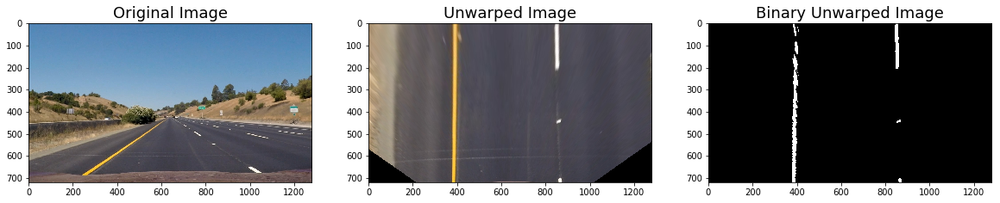

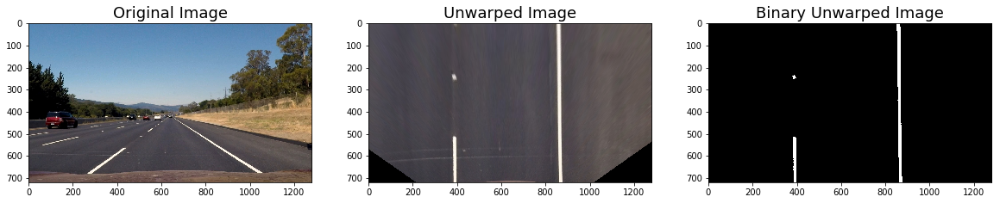

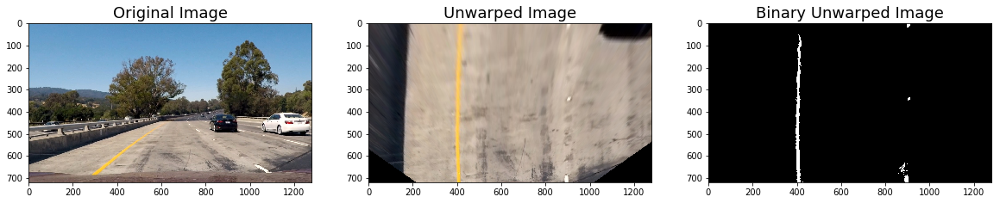

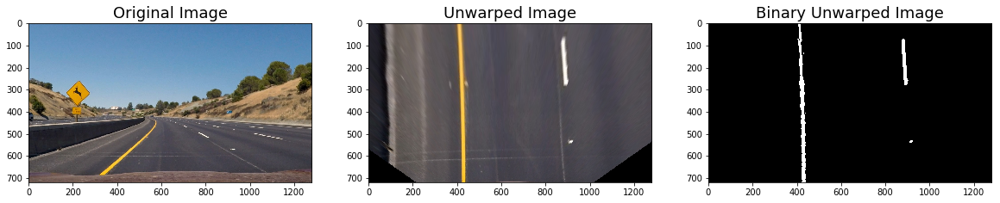

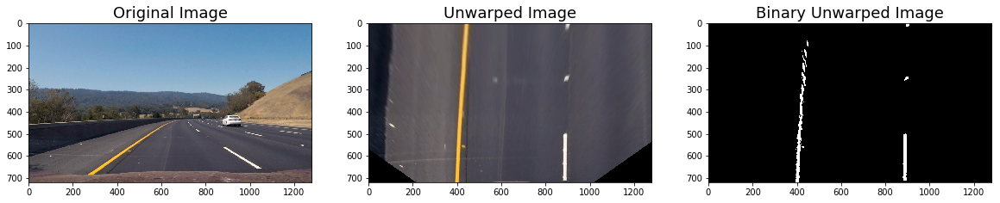

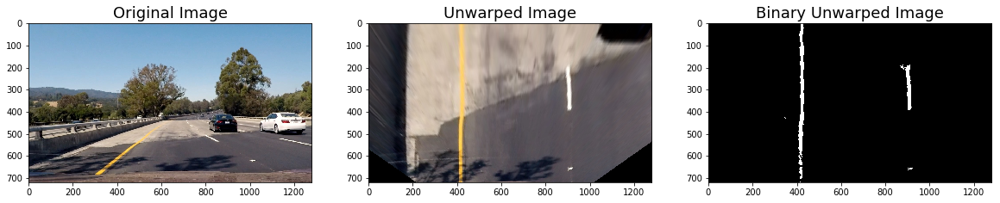

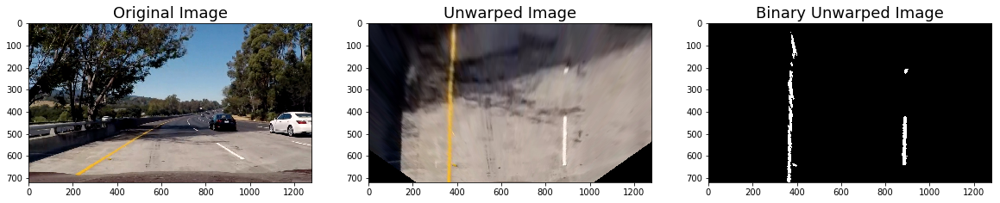

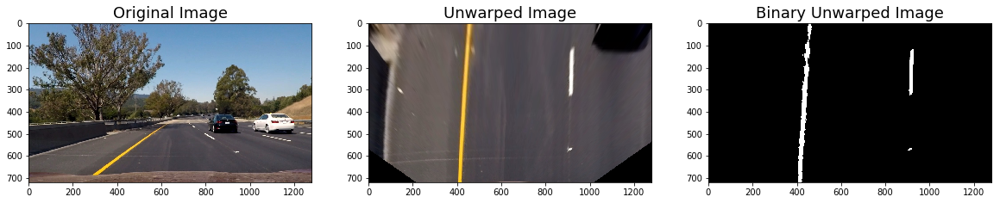

In [40]:
images = glob.glob('test_images/*')
for i in range(0, len(images)):
    img = cv2.imread(images[i])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    combined_binary, Minv = image_process_pipeline(img, Display=True)

### Finding the Lines

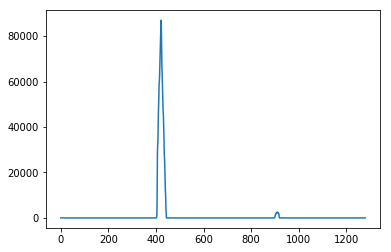

In [16]:
histogram = np.sum(combined_binary[combined_binary.shape[0]//2:,:], axis=0)
plt.plot(histogram)

In [17]:
def polyfit(binary_unwarped_img, Display=False):
    
    process_img = np.dstack((binary_unwarped_img, binary_unwarped_img, binary_unwarped_img))*255
    #plt.imshow(process_img)
    histogram = np.sum(binary_unwarped_img[binary_unwarped_img.shape[0]//2:,:], axis=0)
    
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:])+ midpoint
    
    leftx_current = leftx_base # Current window position to be updated on leftside
    rightx_current = rightx_base # Current window position to be updated on rightside
    
    nonzero = binary_unwarped_img.nonzero()
    nonzeroy = np.array(nonzero[0]) # Row indices of nonzero
    nonzerox = np.array(nonzero[1]) # Column indices of nonzero
    
    margin = 100
    minpix = 50
    
    nwindows = 9
    window_height = np.int(binary_unwarped_img.shape[0]/nwindows) #720/9 = 80
    
    # Empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_unwarped_img.shape[0] - (window+1)*window_height 
        win_y_high = binary_unwarped_img.shape[0] - window*window_height    
        win_xleft_low = leftx_current - margin     
        win_xleft_high = leftx_current + margin    
        win_xright_low = rightx_current - margin   
        win_xright_high = rightx_current + margin  

        # Draw the windows on the visualization image
        cv2.rectangle(process_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high), (0,255,0), 3) 
        cv2.rectangle(process_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high), (0,255,0), 3)
        
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]

        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)

        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
    
    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit a second order polynomial to each
    left_fit, right_fit = (None, None)
    if len(leftx) > 0:
        left_fit = np.polyfit(lefty, leftx, 2)
    if len(rightx) > 0:
        right_fit = np.polyfit(righty, rightx, 2)
    
    # Generate x and y values for plotting
    if right_fit is not None and left_fit is not None:
        ploty = np.linspace(0, binary_unwarped_img.shape[0]-1, binary_unwarped_img.shape[0] )
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    if Display is True:
        process_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
        process_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
        plt.imshow(process_img)
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
        plt.xlim(0, 1280)
        plt.ylim(720, 0)
    
    return left_fit, right_fit, left_lane_inds, right_lane_inds

In [18]:
def prev_polyfit(bwarped, left_fit_prev, right_fit_prev):
    nonzero = bwarped.nonzero()
    nonzeroy = np.array(nonzero[0]) # Row indices of nonzero
    nonzerox = np.array(nonzero[1]) # Column indices of nonzero
    margin = 100
    left_lane_inds = ((nonzerox > (left_fit_prev[0]*(nonzeroy**2) + left_fit_prev[1]*nonzeroy + left_fit_prev[2] - margin)) & 
                      (nonzerox < (left_fit_prev[0]*(nonzeroy**2) + left_fit_prev[1]*nonzeroy + left_fit_prev[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit_prev[0]*(nonzeroy**2) + right_fit_prev[1]*nonzeroy + right_fit_prev[2] - margin)) & 
                       (nonzerox < (right_fit_prev[0]*(nonzeroy**2) + right_fit_prev[1]*nonzeroy + right_fit_prev[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    left_fit_new, right_fit_new = (None, None)
    if len(leftx) != 0:
        # Fit a second order polynomial to each
        left_fit_new = np.polyfit(lefty, leftx, 2)
    if len(rightx) != 0:
        right_fit_new = np.polyfit(righty, rightx, 2)
        
    return left_fit_new, right_fit_new, left_lane_inds, right_lane_inds


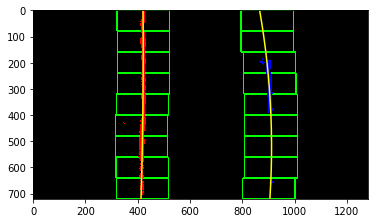

In [19]:
img = cv2.imread(images[5])
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
combined_binary, Minv = image_process_pipeline(img, Display=False)
left_fit, right_fit, left_lane_inds, right_lane_inds = polyfit(combined_binary, Display=True)

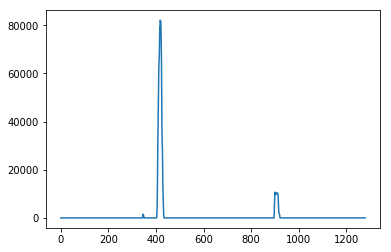

In [20]:
histogram = np.sum(combined_binary[combined_binary.shape[0]//2:,:], axis=0)
plt.plot(histogram)

In [21]:
def calc_curvature1 ( img, left_fit, right_fit):
    ploty = np.linspace(0, img.shape[0]-1, img.shape[0] )
    y_eval = np.max(ploty)
    
    ym_per_px = 20/720
    xm_per_px = 3.7/700
    
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    left_fit_cr = np.polyfit(ploty*ym_per_px, left_fitx*xm_per_px, 2 )
    right_fit_cr = np.polyfit(ploty*ym_per_px, right_fitx*xm_per_px, 2)
    
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_px + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_px + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    car_center = img.shape[1]/2
    left_fit_x_int = left_fit[0]*img.shape[0]**2 + left_fit[1]*img.shape[0] + left_fit[2]
    right_fit_x_int = right_fit[0]*img.shape[0]**2 + right_fit[1]*img.shape[0] + right_fit[2]
    lane_center = (left_fit_x_int +  right_fit_x_int)/2

    center_dist = (car_center - lane_center) * xm_per_px
    
    return left_curverad, right_curverad, center_dist

In [22]:
left_curverad, right_curverad, center_dist = calc_curvature1(combined_binary, left_fit, right_fit)
print(left_curverad, right_curverad, center_dist)

2632.67084811 437.403707696 -0.100195961839


In [23]:
def draw_line(img, unwarped_img, left_fit, right_fit, Minv):
    ploty = np.linspace(0, img.shape[0]-1, img.shape[0] )
    # Create an image to draw the lines on
    process_img = np.copy(img)
    if left_fit is None or right_fit is None:
        return process_img
    
    unwarp_zero = np.zeros_like(unwarped_img).astype(np.uint8)
    color_warp = np.dstack((unwarp_zero, unwarp_zero, unwarp_zero))
    #print(color_warp.shape, process_img.shape)
    left_fitx = left_fit[0]*ploty**2 + right_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
 
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    #pts = np.hstack((pts_right))
    
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    cv2.polylines(color_warp, np.int32([pts_left]), isClosed=False, color=(255,0,0), thickness=15)
    cv2.polylines(color_warp, np.int32([pts_right]), isClosed=False, color=(0,0,255), thickness=15)
    

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(process_img, 1, newwarp, 0.3, 0)
    return(result)
    

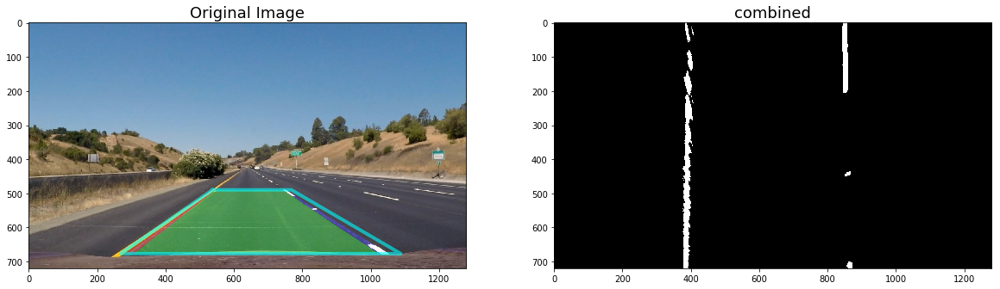

In [41]:
img = cv2.imread(images[0])
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

combined_binary, Minv = image_process_pipeline(img)

left_fit, right_fit, left_lane_inds, right_lane_inds = polyfit(combined_binary)
result = draw_line(img, combined_binary, left_fit, right_fit, Minv)

f, (ax1,ax2) = plt.subplots(1, 2, figsize= (20, 10))
ax1.imshow(result)
x1 = [src[0][0], src[2][0], src[3][0], src[1][0], src[0][0]]
y1 = [src[0][1], src[2][1], src[3][1], src[1][1], src[0][1]]
ax1.plot(x1,y1, color='#00FFFF', alpha=0.6, linewidth=4)
ax1.set_title('Original Image',fontsize=18)
ax2.imshow(combined_binary, cmap='gray')
ax2.set_title('combined',fontsize=18)

In [25]:
def draw_data(result, curverad, center_dist):
    new_result = np.copy(result)
    h = new_result.shape[0]
    font = cv2.FONT_HERSHEY_DUPLEX
    text = 'Radius of Curvature: ' + '{:04.2f}'.format(curverad) + 'm'
    cv2.putText(new_result, text, (40, 70), font, 1.5, (200, 255, 155), 2, cv2.LINE_AA)
    direction = ''
    if center_dist > 0:
        direction = 'right'
    elif center_dist < 0:
        direction = 'left'
    abs_center_dist = abs(center_dist)
    text = 'Vehicle is '+'{:04.3f}'.format(abs_center_dist) + 'm ' + direction + ' from center'
    cv2.putText(new_result, text, (40,120), font, 1.5, (200, 255, 155), 2, cv2.LINE_AA)
    
    return new_result

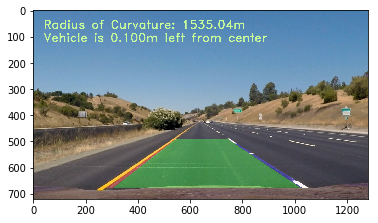

In [26]:
curverad = (left_curverad + right_curverad)/2
new_result = draw_data(result, curverad, center_dist)
plt.imshow(new_result)

In [27]:
Q_LEN = 30 # Number of frames for averaging
class Line1():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = []
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = deque(maxlen=Q_LEN)#None  
        #y values for detected line pixels
        self.ally = deque(maxlen=Q_LEN)#None
    def mean_fit (self, fit):
        if fit is not None:
            if self.best_fit is not None:
                self.diffs = abs(fit-self.best_fit)
            if (self.diffs[0] <= 0.00025 or self.diffs[1] <= 0.25 or self.diffs[2] <= 25.):
                self.detected = True
                self.current_fit.append(fit)
                #if(len(self.current_fit)>=Q_LEN):
                if(len(self.current_fit)>=Q_LEN):
                    self.current_fit.pop(0)
                self.best_fit = np.average(self.current_fit, axis=0)
            else:
                self.detected = False
        else:
            self.detected = False
            if len(self.current_fit) > 0:
                self.current_fit[:len(self.current_fit)-1]
            if len(self.current_fit) > 0:
                self.best_fit = np.average(self.current_fit, axis=0)

        
    

In [31]:
def process_image(img):
    process_img = np.copy(img)
    combined_binary, Minv = image_process_pipeline(process_img)
    if not left_line.detected or not right_line.detected:
        left_fit, right_fit, left_lane_inds, right_lane_inds = polyfit(combined_binary)
    else:
        left_fit, right_fit, left_lane_inds, right_lane_inds = prev_polyfit(combined_binary, left_line.best_fit, right_line.best_fit)
    
    if left_fit is not None and right_fit is not None:
        height = process_img.shape[0]
        left_fitx = left_fit[0]*height**2 + left_fit[1]*height + left_fit[2]
        right_fitx = right_fit[0]*height**2 + right_fit[1]*height + right_fit[2]
    
    if left_fit is not None and right_fit is not None:
        left_line.mean_fit(left_fit)
        right_line.mean_fit(right_fit)
    
    if left_line.best_fit is not None and right_line.best_fit is not None:
        line_img = draw_line(img, combined_binary, left_line.best_fit, right_line.best_fit, Minv)
        left_curverad, right_curverad, center_dist = calc_curvature1(line_img, left_line.best_fit, right_line.best_fit)
        curverad = (left_curverad + right_curverad)/2
        line_img = draw_data(line_img, curverad, center_dist)
    else:
        line_img = process_img
        
    return line_img

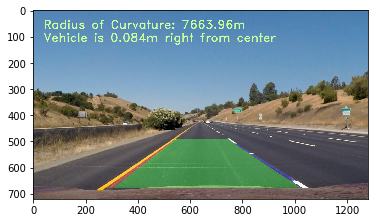

In [32]:
left_line = Line1()
right_line = Line1()
img = cv2.imread(images[0])
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
new = process_image(img)
plt.imshow(new)


In [33]:

left_line = Line1()
right_line = Line1()
video_output1 = 'project_video_output.mp4'
video_input1 = VideoFileClip('project_video.mp4')
processed_video = video_input1.fl_image(process_image)
%time processed_video.write_videofile(video_output1, audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████▉| 1260/1261 [02:06<00:00, 11.52it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

CPU times: user 3min 31s, sys: 18 s, total: 3min 49s
Wall time: 2min 7s
